In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV 
from sklearn.feature_selection import SequentialFeatureSelector, RFE, SelectKBest, f_regression, SelectFromModel
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn import linear_model, tree

warnings.filterwarnings("ignore")

<br>
<br>

# <span style="font-weight: bold; font-size:150%; font-variant: small-caps;">Spis treści:</span>
***
1. [ANALIZA ZBIORU DANYCH](#data_read)

    1.1. [OPIS ZBIORU ORAZ KOLUMN](#read)

    1.2. [WCZYTANIE  DANYCH](#read)
    
    1.3. [BADANIE ZMIENNYCH I WIZUALIZACJE](#analyze)
    
      * [Wykres pudełkowy](#boxplot)
        
      * [Histogramy](#histplot)
      
    1.4. [KORELACJE POMIĘDZY ZMIENNYMI](#corrplot)
    
    1.5. [WNIOSKI](#summary2)
    
2. [PRZYGOTOWANIE ZBIORU DANYCH](#data_prep)
    
    2.1. [TWORZENIE NOWYCH CECH](#feature_create)
    
    2.2. [USUWANIE ODRZUCONYCH CECH](#feature_delete)
    
    2.3. [WARTOŚCI ODSTAJĄCE](#outliners)
    
    2.4. [NORMALIZACJA](#normalize2)

3. [WYBÓR CECH](#feature_selection)
     * [Forward Stepwise](#feature_select1)
     * [Backward Stepwise](#feature_select2)
     * [Lasso](#feature_select3)
     * [Ridge](#feature_select4)
     * [SelectKBest](#feature_select6)
     * [Drzewa](#feature_select7)
     * [SelectFromModel - Regresja liniowa](#feature_select8)
     
4. [PORÓWANANIE METOD DOBORU CECH](#feature_selection_comp)

5. [MODEL REGRESJI](#regression)

***

<br>
<br>
<br>

# <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">1. Analiza zbioru danych </span><a id='data_read'></a>

## <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">1.1 Opis zbioru oraz kolumn </span><a id='desc'></a>
>Zbiór danych zawera pomiary wykonywane w domu przez ok. 4.5miesiąca przy pomocy urządzenia z interfejsem ZigBee. Każda wartość była monitorowana przez 10 minut w ciągu dnia, a następnie wyciagna z nich była srednia.

>date time year-month-day hour:minute:second

>Appliances, energy use in Wh

>lights, energy use of light fixtures in the house in Wh

>T1, Temperature in kitchen area, in Celsius

>RH1, Humidity in kitchen area, in % 

>T2, Temperature in living room area, in Celsius 

>RH2, Humidity in living room area, in %

>T3, Temperature in laundry room area

>RH3, Humidity in laundry room area, in % 

>T4, Temperature in office room, in Celsius 

>RH4, Humidity in office room, in %

>T5, Temperature in bathroom, in Celsius

>RH5, Humidity in bathroom, in % 

>T6, Temperature outside the building (north side), in Celsius 

>RH6, Humidity outside the building (north side), in %

>T7, Temperature in ironing room , in Celsius

>RH7, Humidity in ironing room, in % 

>T8, Temperature in teenager room 2, in Celsius 

>RH8, Humidity in teenager room 2, in %

>T9, Temperature in parents room, in Celsius

>RH9, Humidity in parents room, in % 

>To, Temperature outside (from Chievres weather station), in Celsius Pressure (from Chievres weather station), in mm Hg 

>RHout, Humidity outside (from Chievres weather station), in %

>Wind speed (from Chievres weather station), in m/s

>Visibility (from Chievres weather station), in km

>Tdewpoint (from Chievres weather station), Â°C

>rv1, Random variable 1, nondimensional

>rv2, Random variable 2, nondimensional 

## <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">1.2 Wczytanie danych </span><a id='read'></a>

In [55]:
df = pd.read_csv("KAG_energydata_complete.csv")
df

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.890000,47.596667,19.200000,44.790000,19.790000,44.730000,19.000000,...,17.033333,45.5300,6.600000,733.5,92.000000,7.000000,63.000000,5.300000,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.890000,46.693333,19.200000,44.722500,19.790000,44.790000,19.000000,...,17.066667,45.5600,6.483333,733.6,92.000000,6.666667,59.166667,5.200000,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.890000,46.300000,19.200000,44.626667,19.790000,44.933333,18.926667,...,17.000000,45.5000,6.366667,733.7,92.000000,6.333333,55.333333,5.100000,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.890000,46.066667,19.200000,44.590000,19.790000,45.000000,18.890000,...,17.000000,45.4000,6.250000,733.8,92.000000,6.000000,51.500000,5.000000,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.890000,46.333333,19.200000,44.530000,19.790000,45.000000,18.890000,...,17.000000,45.4000,6.133333,733.9,92.000000,5.666667,47.666667,4.900000,10.084097,10.084097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,2016-05-27 17:20:00,100,0,25.566667,46.560000,25.890000,42.025714,27.200000,41.163333,24.700000,...,23.200000,46.7900,22.733333,755.2,55.666667,3.333333,23.666667,13.333333,43.096812,43.096812
19731,2016-05-27 17:30:00,90,0,25.500000,46.500000,25.754000,42.080000,27.133333,41.223333,24.700000,...,23.200000,46.7900,22.600000,755.2,56.000000,3.500000,24.500000,13.300000,49.282940,49.282940
19732,2016-05-27 17:40:00,270,10,25.500000,46.596667,25.628571,42.768571,27.050000,41.690000,24.700000,...,23.200000,46.7900,22.466667,755.2,56.333333,3.666667,25.333333,13.266667,29.199117,29.199117
19733,2016-05-27 17:50:00,420,10,25.500000,46.990000,25.414000,43.036000,26.890000,41.290000,24.700000,...,23.200000,46.8175,22.333333,755.2,56.666667,3.833333,26.166667,13.233333,6.322784,6.322784


In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

In [57]:
df.describe()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


In [58]:
df.isna().sum()

date           0
Appliances     0
lights         0
T1             0
RH_1           0
T2             0
RH_2           0
T3             0
RH_3           0
T4             0
RH_4           0
T5             0
RH_5           0
T6             0
RH_6           0
T7             0
RH_7           0
T8             0
RH_8           0
T9             0
RH_9           0
T_out          0
Press_mm_hg    0
RH_out         0
Windspeed      0
Visibility     0
Tdewpoint      0
rv1            0
rv2            0
dtype: int64

>Zbiór zawiera 19735 rekordów oraz 29 kolumn. Jest 1 kolumna z datą, 2 kolumny z liczbami całkowitymi oraz 26 z liczbami typu float.  W zbiorze nie występują wartości brakujace. 

## <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">1.3. Badanie zmiennych i wizualizacje</span><a id='analyze'></a>

Text(0.5, 1.0, 'Zużycie prądu w zależności od dnia')

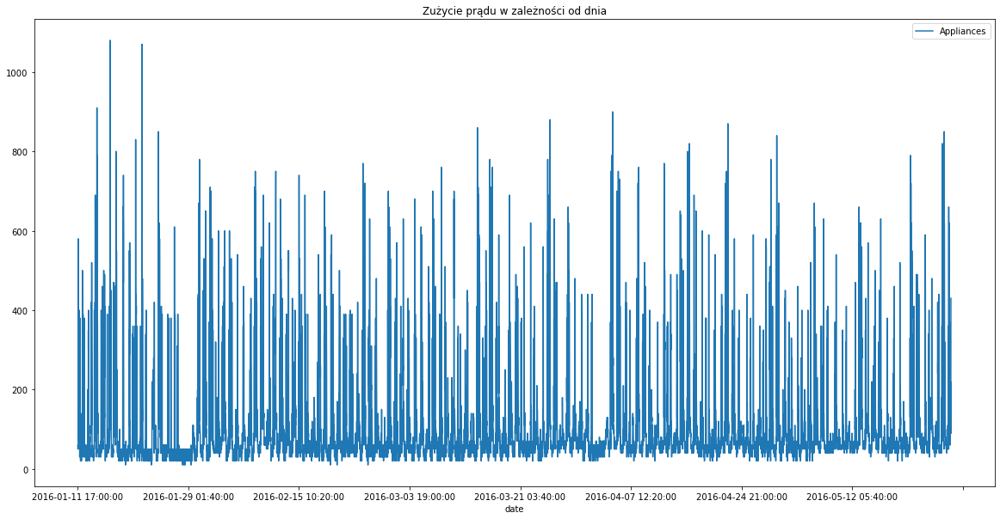

In [59]:
df.plot(x='date', y='Appliances', figsize=(20,10));
plt.title("Zużycie prądu w zależności od dnia")

In [60]:
df['date'] = pd.to_datetime(df['date'])

df['day'] = df.date.dt.day
df['month'] = df.date.dt.month
df['week'] = df.date.dt.week
df['weekday'] = df.date.dt.weekday + 1
df['hour'] = df.date.dt.hour

df.drop(columns=['date'], inplace=True)
df.drop(columns=['rv1'], inplace=True)
df.drop(columns=['rv2'], inplace=True)

In [61]:
df

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,day,month,week,weekday,hour
0,60,30,19.890000,47.596667,19.200000,44.790000,19.790000,44.730000,19.000000,45.566667,...,733.5,92.000000,7.000000,63.000000,5.300000,11,1,2,1,17
1,60,30,19.890000,46.693333,19.200000,44.722500,19.790000,44.790000,19.000000,45.992500,...,733.6,92.000000,6.666667,59.166667,5.200000,11,1,2,1,17
2,50,30,19.890000,46.300000,19.200000,44.626667,19.790000,44.933333,18.926667,45.890000,...,733.7,92.000000,6.333333,55.333333,5.100000,11,1,2,1,17
3,50,40,19.890000,46.066667,19.200000,44.590000,19.790000,45.000000,18.890000,45.723333,...,733.8,92.000000,6.000000,51.500000,5.000000,11,1,2,1,17
4,60,40,19.890000,46.333333,19.200000,44.530000,19.790000,45.000000,18.890000,45.530000,...,733.9,92.000000,5.666667,47.666667,4.900000,11,1,2,1,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,100,0,25.566667,46.560000,25.890000,42.025714,27.200000,41.163333,24.700000,45.590000,...,755.2,55.666667,3.333333,23.666667,13.333333,27,5,21,5,17
19731,90,0,25.500000,46.500000,25.754000,42.080000,27.133333,41.223333,24.700000,45.590000,...,755.2,56.000000,3.500000,24.500000,13.300000,27,5,21,5,17
19732,270,10,25.500000,46.596667,25.628571,42.768571,27.050000,41.690000,24.700000,45.730000,...,755.2,56.333333,3.666667,25.333333,13.266667,27,5,21,5,17
19733,420,10,25.500000,46.990000,25.414000,43.036000,26.890000,41.290000,24.700000,45.790000,...,755.2,56.666667,3.833333,26.166667,13.233333,27,5,21,5,17


Text(0.5, 1.0, 'Średnie zużycie prądu w zależności od godziny')

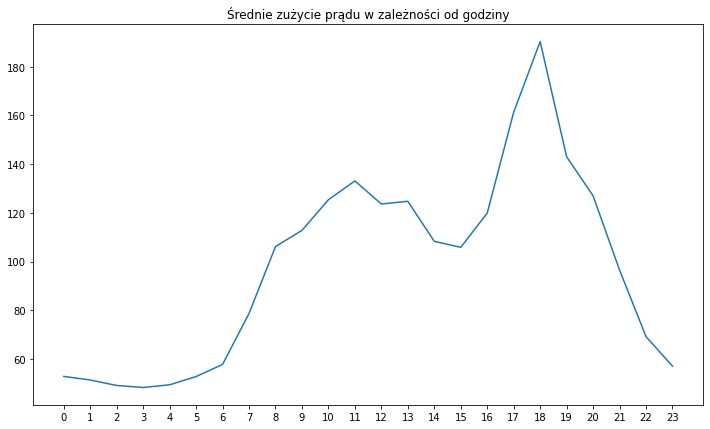

In [62]:
plt.figure(figsize=(12,7))
plt.plot(df.groupby('hour')['Appliances'].mean())
plt.xticks(np.arange(0,24,1))
plt.title("Średnie zużycie prądu w zależności od godziny")

Text(0.5, 1.0, 'Średnie zużycie prądu w zależności od dnia tygodnia')

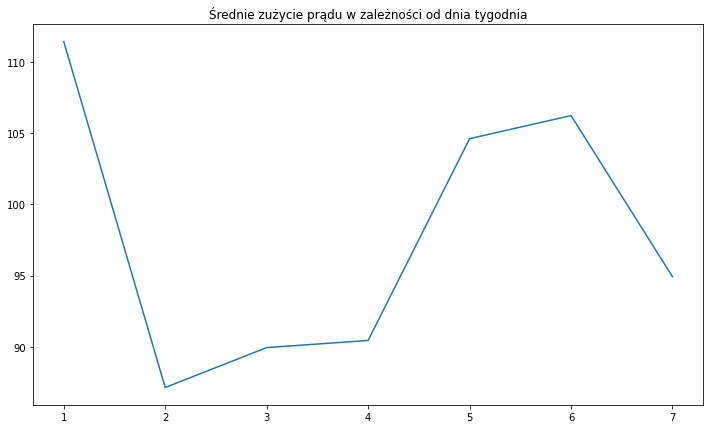

In [63]:
plt.figure(figsize=(12,7))
plt.plot(df.weekday.unique(),df.groupby('weekday')['Appliances'].mean())
plt.title("Średnie zużycie prądu w zależności od dnia tygodnia")

>Najwyższe zużycie prądu występuje w godzinach 17-19

>Co ciekawe, największe zużycie widać w dni 1-poniedziałek, a nie przez weekend

### <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">1.3.1. Wykresy pudełkowe </span><a id='boxplot'></a>

<AxesSubplot:>

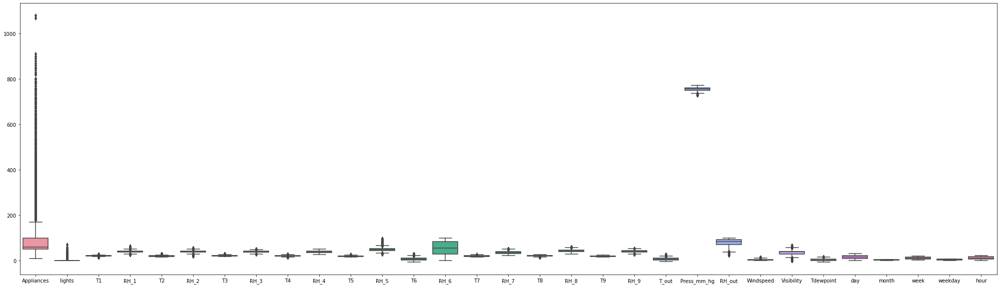

In [11]:
plt.figure(figsize=(35,10))
sns.boxplot(data=df)

>Z wykresu wszystkich zminnych mało wynika. W celu lepszego zobrowania zmiennych, zbadamy wykres każdej z nich osobno

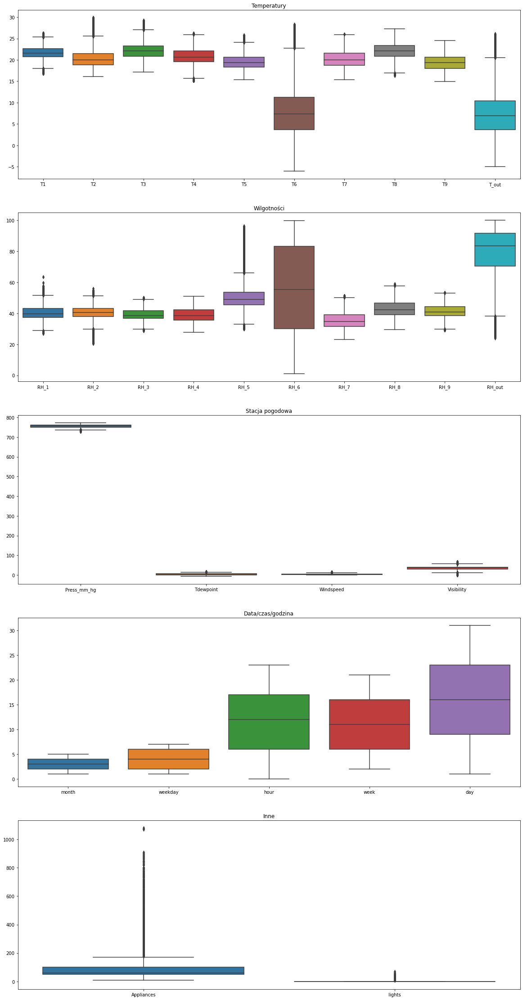

In [12]:
temps = ["T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T_out"]
humidities = ["RH_1", "RH_2", "RH_3", "RH_4", "RH_5", "RH_6", "RH_7", "RH_8", "RH_9", "RH_out"]
station = ["Press_mm_hg", "Tdewpoint", "Windspeed", "Visibility"] 
date = ['month', 'weekday', 'hour', 'week', 'day']
other = ["Appliances", "lights"]

plt.figure(figsize=(20,40))

plt.subplot(5, 1, 1)
sns.boxplot(data=df[temps])
plt.title("Temperatury")

plt.subplot(5, 1, 2)
sns.boxplot(data=df[humidities])
plt.title("Wilgotności")

plt.subplot(5, 1, 3)
sns.boxplot(data=df[station])
plt.title("Stacja pogodowa")

plt.subplot(5, 1, 4)
sns.boxplot(data=df[date])
plt.title("Data/czas/godzina")

plt.subplot(5, 1, 5)
sns.boxplot(data=df[other])
plt.title("Inne")

plt.show()

>Nie wszystkie z powyższych wykresów są czytelne, tak więc wyświetlamy część ponownie

Text(0.5, 1.0, 'Światło')

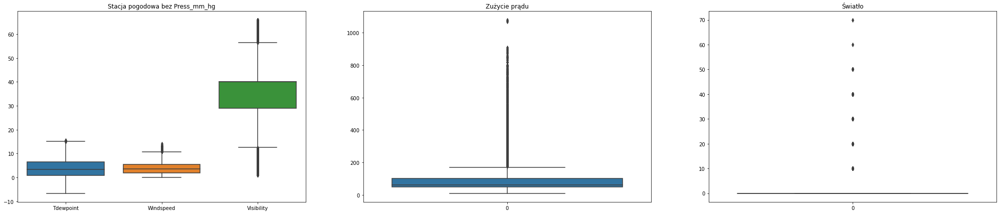

In [13]:
plt.figure(figsize=(35,7))
plt.subplot(1,3,1)
sns.boxplot(data=df[station[1:]])
plt.title("Stacja pogodowa bez Press_mm_hg")

plt.subplot(1,3,2)
sns.boxplot(data=df[other[0]])
plt.title("Zużycie prądu")

plt.subplot(1,3,3)
sns.boxplot(data=df[other[1]])
plt.title("Światło")

>Appliances - posiada dużo wartości odstających

>RH1, RH2, RH3, RH4, RH5, RH7, RH8 oraz RH9 są do siebie bardzo zbliżone

>T1, T2, T3, T4, T5, T7, T8, T9 mają podoby zakres 

>lights dominującą wartością jest 0 

>w zbiorze występuje dużo wartości odstajacych 

### <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">1.3.2. Histogramy </span><a id='histplot'></a>

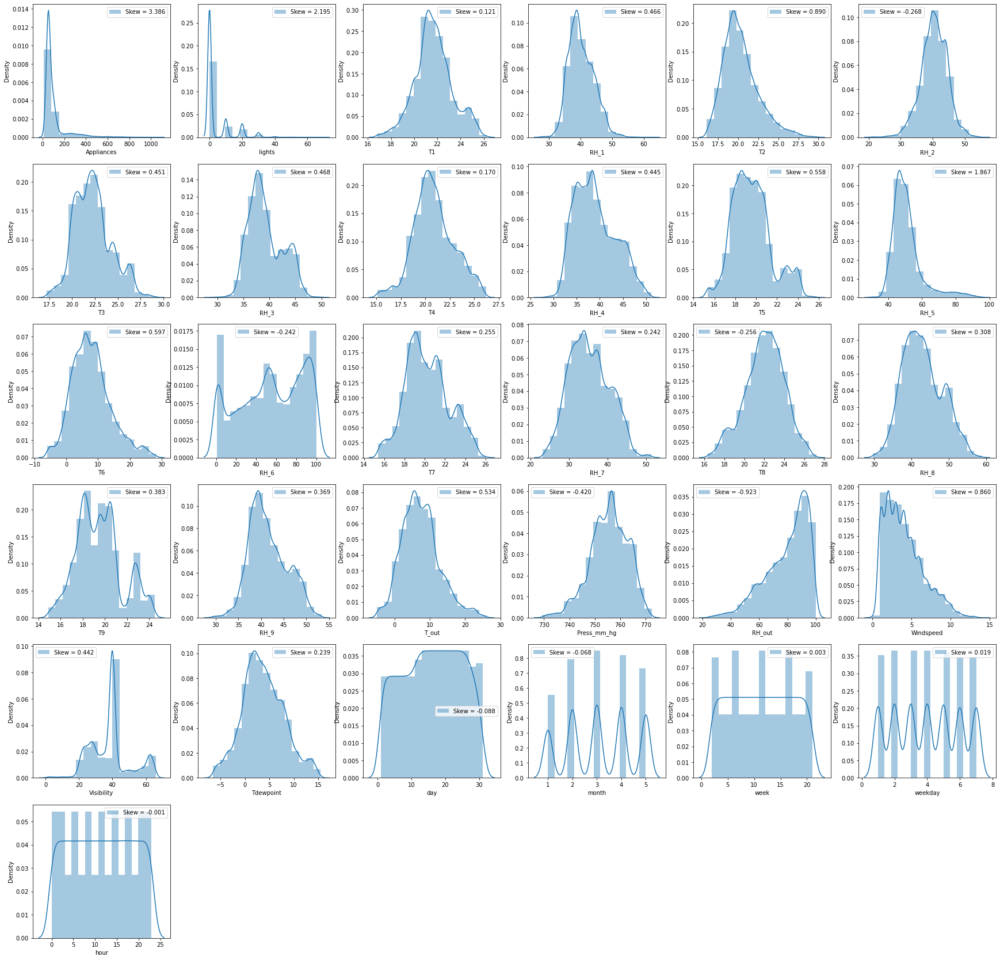

In [14]:
plt.figure(figsize=(30,35))
for i, col in enumerate(df):
    plt.subplot(7, 6, i+1)
    skew = df[col].skew()
    sns.distplot(df[col], label='Skew = %.3f' %(skew), bins=15)
    plt.legend(loc='best')
    
plt.show()


>Nie występują skrajne skośności

>Najbardziej skośną zmienną jest appliances, czyli nasza zmienna docelowa

>Appliances, RH_6, RH_out, Visibility, Windspeed mimo stosunkowo małej skośności są bardzo nieregularne 

>Większość cech zdaje się przyjmować rozkład podobny do normalnego.

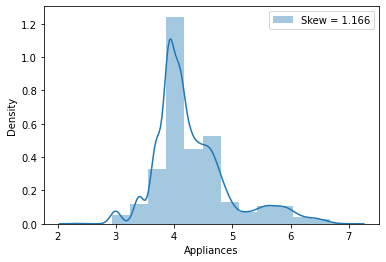

In [15]:
skew = np.log(df['Appliances']).skew()
sns.distplot(np.log(df['Appliances']), label='Skew = %.3f' %(skew), bins=15)
plt.legend(loc='best')

>Logarytmowanie Appliances poprawiło rozkład tej zmiennej. W dalszej części proejktu używać bedziemy log wersji.

In [16]:
df_log = df.copy()
df_log['Appliances'] = np.log(df_log['Appliances'])

## <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">1.4. Korelacja między zmiennymi </span><a id='corrplot'></a>

<AxesSubplot:>

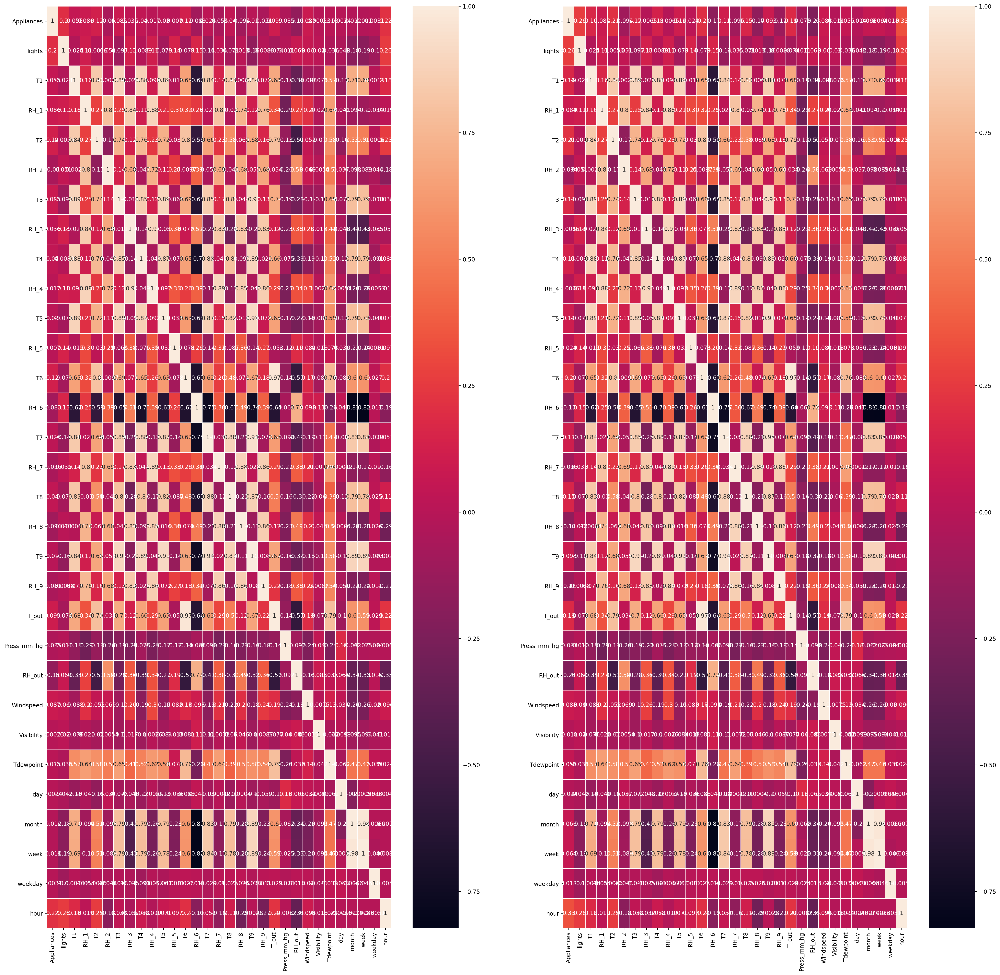

In [17]:
plt.figure(figsize=(30,30),dpi = 200)
plt.subplot(1,2,1)
sns.heatmap(df.corr(),annot = df.corr(), linewidth = 0.5)
plt.subplot(1,2,2)
sns.heatmap(df_log.corr(),annot = df_log.corr(), linewidth = 0.5)

>Mimo tego, że powyższe wykresy są mało czytelne, da się zauważyć, że po zlogarytowaniu kolumna Appliances ma wyzsza korelacje z innymi niz przed

<AxesSubplot:>

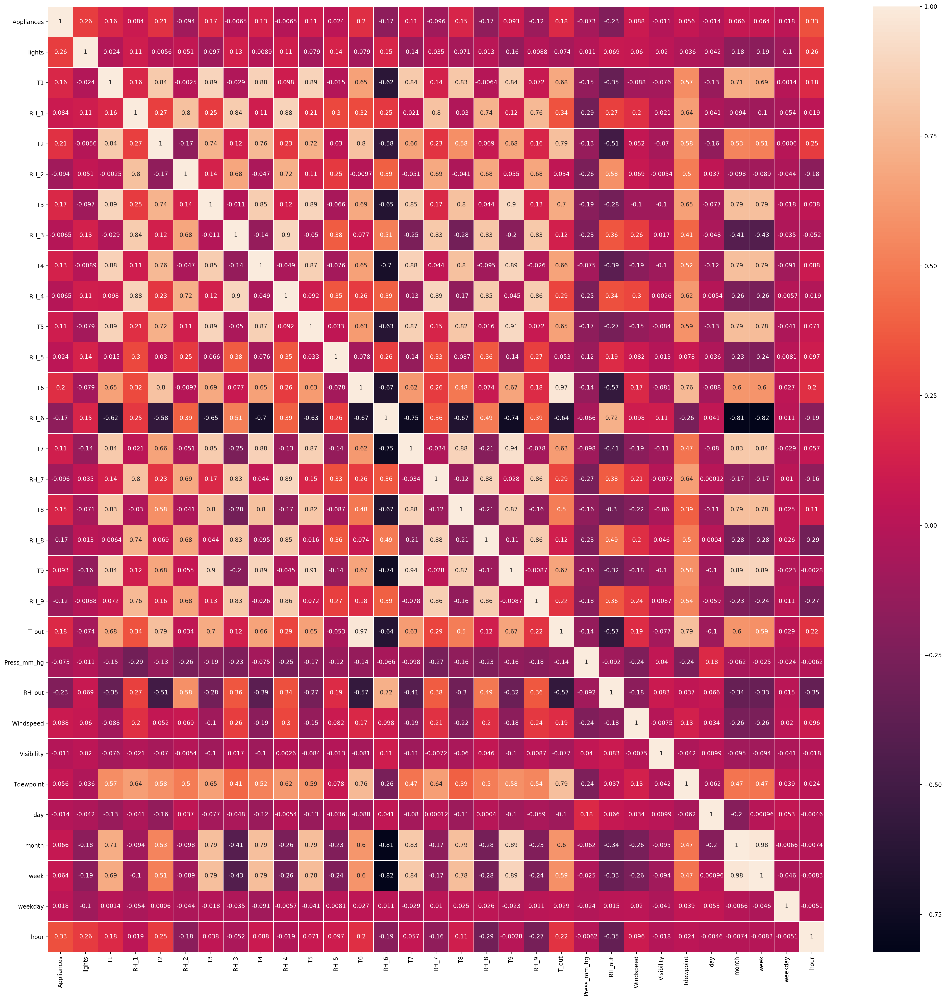

In [18]:
plt.figure(figsize=(30,30),dpi = 200)
sns.heatmap(df_log.corr(),annot = df_log.corr(), linewidth = 0.5)

>W tym zbiorze występuje dużo korelacji między zmiennymi. Na tej podstawie do usunięcia są cechy: T1, T5, T7, RH1, RH2, RH3, RH7. Poza tym wszystkie temperatury wewnątrz domu są mocno skorelowane ze sobą, jednak usunięcie wszystkich z nich byłoby złym posunieciem.

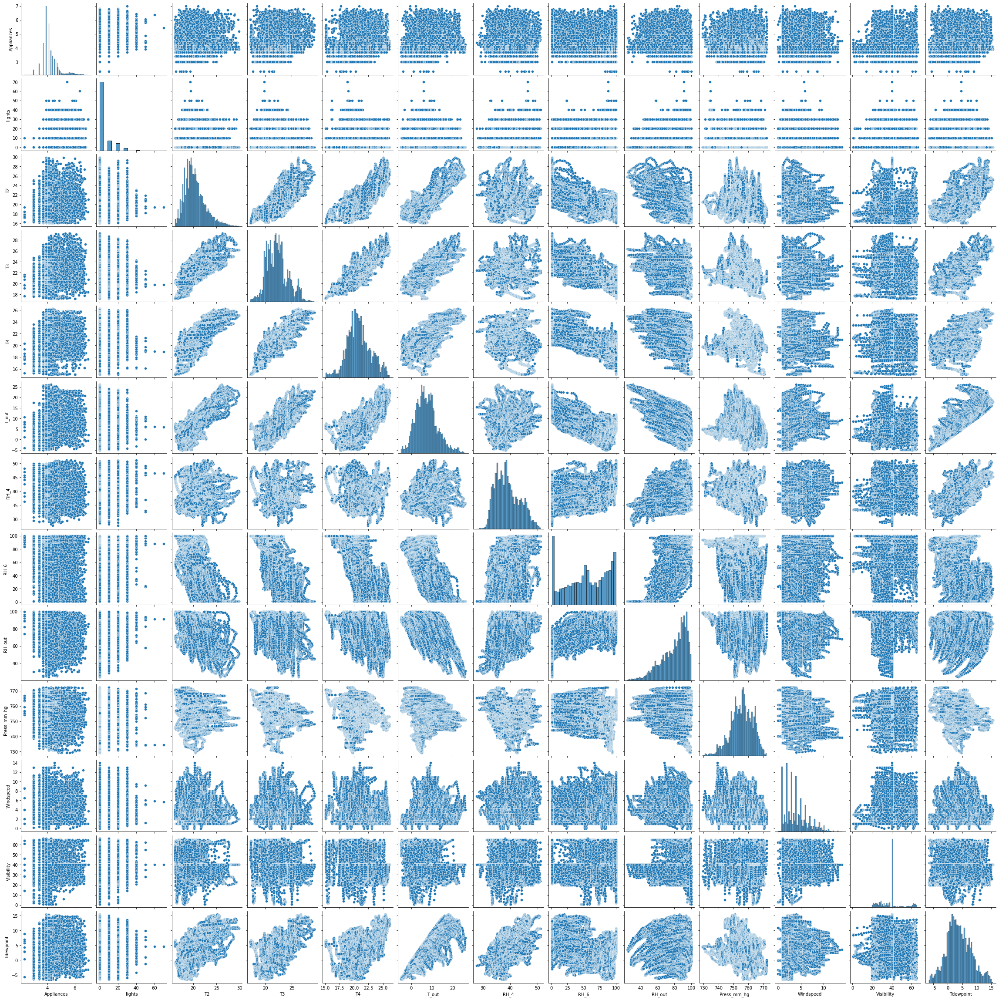

In [19]:
col = ['Appliances', 'lights', 'T2', 'T3', 'T4', 'T_out', 'RH_4', 'RH_6', 'RH_out', 'Press_mm_hg', 'Windspeed', 'Visibility', 'Tdewpoint']
sns.pairplot(df_log[col])

## <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">1.5. Wnioski </span><a id='summary2'></a>

>Na podstawie powyższej analizy, stwierdzialiśmy, że do usunięcia nadają się kolumny:

    *T1, T5, T7, RH1, RH2, RH3, RH7 - poprzez wysoką korelacje
    *Rv1 oraz Rv2 - losowe wartości
    *date- zastąpiona przez nowe kolumny
    
>Rozważaliśmy również usunięcie kolumny lights, jednak jest to kolumna najbardziej skorelowana z Appliances, więc może być przydatna w dalszej części projektu.

>Chcemy zaproponować róznież nowe cechy:

    * T_mean - średnia ze wszystkich temperatur (tworzone przed usunięciem)
    * Rh_mean - średnia ze wszystkich wilgotności (tworzone przed usunięciem)
    * lights_15_20 - zwiększenie wagi włączonego swiatła w godzinach między 15-20 (jeśli hour >= 15 and hour <= 20 to lights*hour)
    
>Operacje na zbiorze danych przed kolejną cześcią projektu:

    * Usuniecie wcześniej wymienionych kolumn
    * Stworzenie powyższych kolumn
    * Normalizacja danych
    * log(Appliances) - już wykonnane 
    * Usunięcie wartości odstajacych
    
>W koljenej częsci,chcemy zobaczyć, które cehcy są najbardziej istotne dla naszego modelu. Chcemy zastosować automatyczne metody doboru cech tj. propagacja w przód itp., a nastęnie sprawdzić, która z tych metod daje nam najlepsze wyniki

# <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">2. Przygotowanie zbioru danych </span><a id='data_prep'></a>

## <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">2.1. Tworzenie nowych cech </span><a id='feature_create'></a>

In [20]:
df2 = df.copy()
df = df_log

In [21]:
df["T_mean"] = df.loc[:, temps[:-1]].mean(axis=1)
df["RH_mean"] = df.loc[:, humidities[:-1]].mean(axis=1)
df["lights_15_20"] = [(df['lights'][n]*i if i >=15 and i<=20 else df['lights'][n]) for n, i in enumerate(df['hour'])]

In [22]:
df

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,Visibility,Tdewpoint,day,month,week,weekday,hour,T_mean,RH_mean,lights_15_20
0,4.094345,30,19.890000,47.596667,19.200000,44.790000,19.790000,44.730000,19.000000,45.566667,...,63.000000,5.300000,11,1,2,1,17,17.167407,50.910741,510
1,4.094345,30,19.890000,46.693333,19.200000,44.722500,19.790000,44.790000,19.000000,45.992500,...,59.166667,5.200000,11,1,2,1,17,17.149630,50.827222,510
2,3.912023,30,19.890000,46.300000,19.200000,44.626667,19.790000,44.933333,18.926667,45.890000,...,55.333333,5.100000,11,1,2,1,17,17.103704,50.628889,510
3,3.912023,40,19.890000,46.066667,19.200000,44.590000,19.790000,45.000000,18.890000,45.723333,...,51.500000,5.000000,11,1,2,1,17,17.067037,50.574815,680
4,4.094345,40,19.890000,46.333333,19.200000,44.530000,19.790000,45.000000,18.890000,45.530000,...,47.666667,4.900000,11,1,2,1,17,17.070741,50.732963,680
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,4.605170,0,25.566667,46.560000,25.890000,42.025714,27.200000,41.163333,24.700000,45.590000,...,23.666667,13.333333,27,5,21,5,17,24.861481,41.122561,0
19731,4.499810,0,25.500000,46.500000,25.754000,42.080000,27.133333,41.223333,24.700000,45.590000,...,24.500000,13.300000,27,5,21,5,17,24.774571,41.079365,0
19732,5.598422,10,25.500000,46.596667,25.628571,42.768571,27.050000,41.690000,24.700000,45.730000,...,25.333333,13.266667,27,5,21,5,17,24.686138,41.211323,170
19733,6.040255,10,25.500000,46.990000,25.414000,43.036000,26.890000,41.290000,24.700000,45.790000,...,26.166667,13.233333,27,5,21,5,17,24.499981,41.215329,170


## <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">2.2. Usuwanie odrzuconych cech </span><a id='feature_delete'></a>

In [23]:
df.drop(columns=['T1'], inplace=True)
df.drop(columns=['T5'], inplace=True)
df.drop(columns=['T7'], inplace=True)
df.drop(columns=['RH_1'], inplace=True)
df.drop(columns=['RH_2'], inplace=True)
df.drop(columns=['RH_3'], inplace=True)
df.drop(columns=['RH_7'], inplace=True)

In [24]:
cols = df.columns
cols

Index(['Appliances', 'lights', 'T2', 'T3', 'T4', 'RH_4', 'RH_5', 'T6', 'RH_6',
       'T8', 'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out',
       'Windspeed', 'Visibility', 'Tdewpoint', 'day', 'month', 'week',
       'weekday', 'hour', 'T_mean', 'RH_mean', 'lights_15_20'],
      dtype='object')

## <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">2.3. Wartości odstające </span><a id='outliners'></a>

>Usunięcie wartości odstających realizujemy w prosty sposób, a mianowicie usuwamy wszystkie wartości, które są oddalone o 3.5 krotność odchylenia standardowego od śreniej.

In [25]:
def remove_outliers(df, features):
    for feature in features:
        df = df[np.abs(df[feature]-df[feature].mean()) <= (3.5*df[feature].std())]
        
    return df

variables = df.columns
df_no_outliners = remove_outliers(df, variables)
newsize = len(df_no_outliners)
originalsize = len(df)
print("Rozmiar oryginalny: ", originalsize)
print("Rozmiar nowy: ",newsize)
print(f"Usunięto: {round((originalsize-newsize)/originalsize*100,2)} % danych")

Rozmiar oryginalny:  19735
Rozmiar nowy:  18509
Usunięto: 6.21 % danych


In [26]:
df_no_outliners.reset_index(drop=True, inplace=True)
df_no_outliners

,Appliances,lights,T2,T3,T4,RH_4,RH_5,T6,RH_6,T8,...,Visibility,Tdewpoint,day,month,week,weekday,hour,T_mean,RH_mean,lights_15_20
0,4.605170,10,19.856667,20.033333,19.000000,48.696667,55.500000,5.900000,88.156667,18.100000,...,40.000000,4.433333,11,1,2,1,19,17.252222,53.519815,190
1,4.605170,10,20.033333,20.100000,19.000000,48.490000,56.042500,5.800000,88.366667,18.150000,...,40.000000,4.350000,11,1,2,1,19,17.286667,53.496574,190
2,4.499810,10,20.166667,20.200000,18.926667,48.156667,56.490000,5.726667,88.160000,18.230000,...,40.000000,4.266667,11,1,2,1,19,17.310741,53.378889,190
3,4.605170,30,20.533333,20.390000,19.390000,47.560000,70.990000,5.530000,85.730000,19.133333,...,40.000000,3.833333,11,1,2,1,21,17.711481,53.285926,30
4,4.605170,20,20.666667,20.390000,19.390000,47.500000,62.430000,5.433333,86.326667,19.200000,...,40.000000,3.800000,11,1,2,1,21,17.757407,52.372222,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18504,4.605170,0,25.890000,27.200000,24.700000,45.590000,52.400000,24.796667,1.000000,24.700000,...,23.666667,13.333333,27,5,21,5,17,24.861481,41.122561,0
18505,4.499810,0,25.754000,27.133333,24.700000,45.590000,52.326667,24.196667,1.000000,24.700000,...,24.500000,13.300000,27,5,21,5,17,24.774571,41.079365,0
18506,5.598422,10,25.628571,27.050000,24.700000,45.730000,52.266667,23.626667,1.000000,24.700000,...,25.333333,13.266667,27,5,21,5,17,24.686138,41.211323,170
18507,6.040255,10,25.414000,26.890000,24.700000,45.790000,52.200000,22.433333,1.000000,24.662500,...,26.166667,13.233333,27,5,21,5,17,24.499981,41.215329,170


Text(0.5, 1.0, 'Po usunięciu')

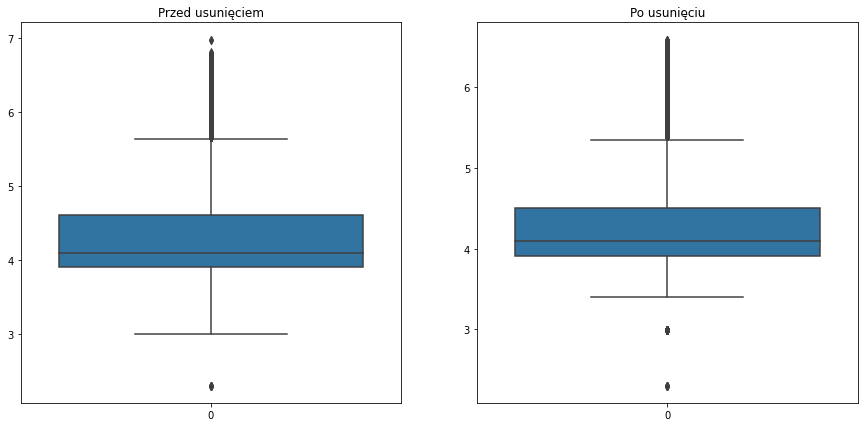

In [27]:
plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
sns.boxplot(data=df['Appliances'])
plt.title("Przed usunięciem")

plt.subplot(1,2,2)
sns.boxplot(data=df_no_outliners['Appliances'])
plt.title("Po usunięciu")

## <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">2.4. Normalizacja </span><a id='normalize2'></a>

In [28]:
y = df_no_outliners['Appliances']
X = df_no_outliners.drop(columns=['Appliances'])

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 2137)
cols = X_train.columns

In [30]:
scaler = StandardScaler() 
X_train_scaled=scaler.fit_transform(X_train)
X_test_scaled=scaler.transform(X_test)
X_train_scaled

array([[-0.43576043,  0.5087804 , -0.73558877, ..., -0.58810021,
         1.16818727, -0.26895405],
       [ 4.20396012,  0.30193386,  0.06024628, ..., -0.12175896,
         2.06725755,  0.43390557],
       [ 1.11081308, -0.17993769, -1.18324598, ...,  0.05983954,
        -1.77198015,  3.71391715],
       ...,
       [ 2.6573866 ,  0.97100731,  1.45793157, ...,  1.27980098,
        -0.86035141,  0.19961903],
       [ 2.6573866 , -0.50349652, -0.28295759, ..., -0.20303986,
        -0.23569967,  0.19961903],
       [-0.43576043,  2.47016324,  0.86105529, ...,  1.84409673,
        -1.7215232 , -0.26895405]])

In [31]:
X_train_scaled = pd.DataFrame(X_train_scaled, columns =cols)
X_test_scaled = pd.DataFrame(X_test_scaled, columns =cols)

# <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">3. Wybór cech </span><a id='feature_selection'></a>

> Z pomocą każdego selektora cech, staramy się wybrać 8 najlepszych cech. W przypadku regularyzacji Rigde, używamy całego zbioru danych oraz szukamy najlepszego parametru alpha przy pomocy GS. Również w metodzie SelectFromModel dla lasu losowego używam GS w celu dobrania hiper parameów. 

## <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">3.1. Forward stepwise </span><a id='feature_select1'></a>

In [32]:
lr = linear_model.LinearRegression()
sfs = SequentialFeatureSelector(lr, n_features_to_select=8, n_jobs=-1)
sfs.fit(X_train_scaled, y_train)

features1 = X_train.columns[sfs.get_support()]
features1

Index(['lights', 'T3', 'T6', 'RH_8', 'T_out', 'week', 'hour', 'lights_15_20'], dtype='object')

## <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">3.2. Backward stepwise </span><a id='feature_select2'></a>

In [33]:
lr = linear_model.LinearRegression()
sfs = SequentialFeatureSelector(lr, n_features_to_select=8, direction="backward", n_jobs=-1)
sfs.fit(X_train_scaled, y_train)

features2 = X_train.columns[sfs.get_support()]
features2

Index(['lights', 'T3', 'T6', 'T8', 'RH_8', 'week', 'hour', 'T_mean'], dtype='object')

## <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">3.3. Lasso </span><a id='feature_select3'></a>

In [34]:
lasso = linear_model.Lasso(alpha=0.04)
lasso.fit(X_train_scaled, y_train)
features3 = X_train.columns[lasso.coef_ != 0]
features3

Index(['lights', 'T3', 'T6', 'RH_8', 'Press_mm_hg', 'RH_out', 'hour',
       'lights_15_20'],
      dtype='object')

## <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">3.4. Ridge </span><a id='feature_select4'></a>

In [35]:
ridge = linear_model.Ridge()
params = { "alpha" : np.linspace(10,1e2, 40)}

GS = GridSearchCV(estimator=ridge, param_grid=params, cv=5, n_jobs=-1, scoring="neg_mean_squared_error")
GS= GS.fit(X_train_scaled, y_train)

print("Najlepsza wartość: ", GS.best_params_)
ridge =  GS.best_estimator_
ridge.coef_

Najlepsza wartość:  {'alpha': 10.0}


array([ 0.06604986,  0.12232111,  0.42235368,  0.08976087, -0.08246933,
       -0.07651508,  0.59594632, -0.31632503,  0.23906602, -0.24834213,
       -0.02239352, -0.09735556, -0.22232172, -0.01547004, -0.03259505,
        0.0296846 ,  0.01149392, -0.04463983, -0.00099163, -0.02313973,
       -0.08298531,  0.02484799,  0.07848894, -0.83236507,  0.586282  ,
        0.05777491])

## <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">3.5. SelectKBest </span><a id='feature_select6'></a>

In [36]:
select = SelectKBest(score_func=f_regression, k=8)
select.fit(X_train_scaled, y_train)

cechy_df = pd.DataFrame(list(zip(cols, select.scores_)), columns=['cecha', 'waznosc'])
cechy_df = cechy_df.sort_values('waznosc', ascending=False)[:8]
features5 = cechy_df['cecha'].values
features5

array(['hour', 'RH_out', 'T6', 'T2', 'lights_15_20', 'RH_6', 'T_mean',
       'T_out'], dtype=object)

## <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">3.6 Drzewo decyzyjne </span><a id='feature_select7'></a>

In [39]:
dt = tree.DecisionTreeRegressor()

params = { 
           "criterion": ["squared_error", "absolute_error", "poisson", "friedman_mse"],
           "max_depth": np.arange(2, 12, 1),
           "min_samples_split" : np.linspace(0.1, 1, 5),
           "min_samples_leaf" : np.linspace(0.05, 0.5, 5)
         }

GS = GridSearchCV(estimator=dt, param_grid=params, cv=5, n_jobs=-1, scoring="neg_mean_squared_error")
GS= GS.fit(X_train_scaled, y_train)

dt = GS.best_estimator_.fit(X_train_scaled, y_train)
print(dt)

features6 = X_train.columns[dt.feature_importances_ != 0]
features6

DecisionTreeRegressor(criterion='friedman_mse', max_depth=8,
                      min_samples_leaf=0.05, min_samples_split=0.1)


Index(['T3', 'T6', 'RH_6', 'T8', 'Press_mm_hg', 'week', 'hour', 'T_mean'], dtype='object')

## <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">3.7 SelectFromModel</span><a id='feature_select8'></a>

In [40]:
lr = linear_model.LinearRegression().fit(X_train_scaled, y_train)
model = SelectFromModel(lr, prefit=True, max_features = 8)

features7 = X_train.columns[model.get_support()]
features7

Index(['T3', 'T6', 'RH_6', 'T8', 'month', 'week', 'T_mean', 'RH_mean'], dtype='object')

# <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">4. Porównanie metod doboru cech </span><a id='feature_selection_comp'></a>

In [41]:
pd.DataFrame(list(zip(np.sort(features1), np.sort(features2),np.sort(features3),np.sort(features5),np.sort(features6),np.sort(features7))),
               columns =["Krokowa w przód", "Krokowa w tył", "Lasso", "KBest", "Drzewo", "SelectFromModel - liniowa"])

,Krokowa w przód,Krokowa w tył,Lasso,KBest,Drzewo,SelectFromModel - liniowa
0,RH_8,RH_8,Press_mm_hg,RH_6,Press_mm_hg,RH_6
1,T3,T3,RH_8,RH_out,RH_6,RH_mean
2,T6,T6,RH_out,T2,T3,T3
3,T_out,T8,T3,T6,T6,T6
4,hour,T_mean,T6,T_mean,T8,T8
5,lights,hour,hour,T_out,T_mean,T_mean
6,lights_15_20,lights,lights,hour,hour,month
7,week,week,lights_15_20,lights_15_20,week,week


> Widać pewne zależności pomiędzy wybranymi metodami. Większość z nich wybrała kolumnę week, hour, T3 oraz wszystkie kolumnę T6. Często powtarza się również kolumna: lights, T3, T_mean, Rh_mean. Ogólnie mówiąc, większość wybranych cech jest do sibie zbliżona.

In [42]:
selected = [cols, features1, features2, features3, features5, features6, features7]
names = ["wszystko", "Krokowa w przód", "Krokowa w tył", "Lasso", "KBest", "Drzewo", "SelectFromModel - liniowa"]
train_scores = {}
test_scores = {}

for col, name in zip(selected, names):
    lr = linear_model.LinearRegression()
    lr.fit(X_train_scaled[col], y_train)
    train_scores[name] = mean_squared_error(lr.predict(X_train_scaled[col]), y_train)
    test_scores[name] = mean_squared_error(lr.predict(X_test_scaled[col]), y_test)

#Ridge
ridge.fit(X_train_scaled, y_train)
train_scores['Ridge'] = mean_squared_error(ridge.predict(X_train_scaled), y_train)
test_scores['Ridge'] = mean_squared_error(ridge.predict(X_test_scaled), y_test)

print(train_scores)
print(test_scores)

{'wszystko': 0.30244741089497484, 'Krokowa w przód': 0.3153303356389368, 'Krokowa w tył': 0.3143923290363777, 'Lasso': 0.32537795089718385, 'KBest': 0.33103333641320787, 'Drzewo': 0.33302280329184697, 'SelectFromModel - liniowa': 0.34729780501228513, 'Ridge': 0.3027662498661941}
{'wszystko': 0.293298981749911, 'Krokowa w przód': 0.30607670507269824, 'Krokowa w tył': 0.30380503452302166, 'Lasso': 0.31868975332820004, 'KBest': 0.32268437692456875, 'Drzewo': 0.32564276140925014, 'SelectFromModel - liniowa': 0.3345847888712276, 'Ridge': 0.2933979884017569}


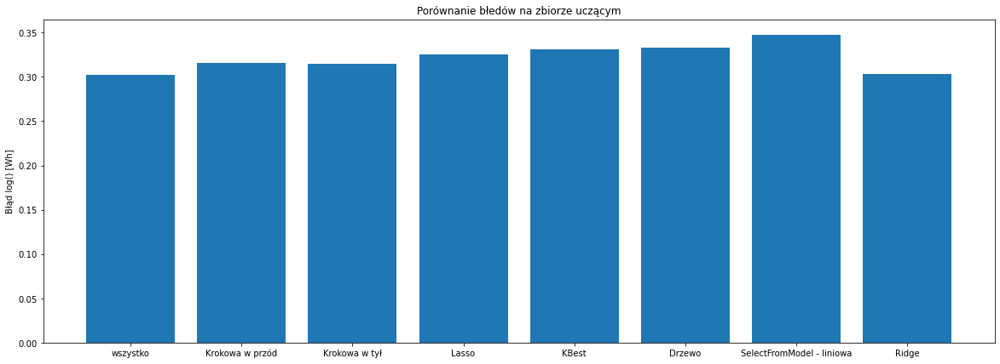

In [48]:
plt.figure(figsize=(20,7))
plt.bar(range(len(train_scores)), list(train_scores.values()), align='center')
plt.xticks(range(len(train_scores)), list(train_scores.keys()))
plt.title("Porównanie błedów na zbiorze uczącym")
plt.ylabel("Błąd log() [Wh]")
plt.show()

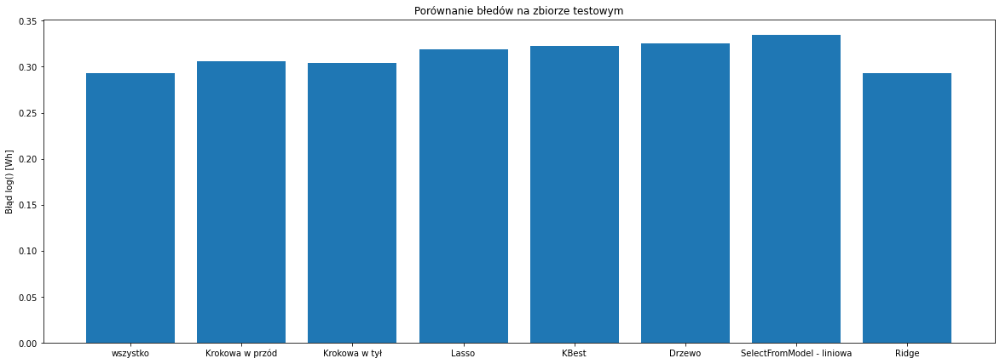

In [49]:
plt.figure(figsize=(20,7))
plt.bar(range(len(test_scores)), list(test_scores.values()), align='center')
plt.xticks(range(len(test_scores)), list(test_scores.keys()))
plt.title("Porównanie błedów na zbiorze testowym")
plt.ylabel("Błąd log() [Wh]")
plt.show()

### Analizując powysze wykresy należy pamiętać, że zmienna docelowa Appliances zostalo przekształcona przy pomocy np.log(). Jest to szczególnie istotne, gdybyśmy chcieli przewidywać wartości w przyszłości. Należy wtedy zastosować przekształcenie wykładniczne np.exp()

<br>
<br>

> Na podstawie powyższych wykresów można stwierdzić, że:

    * Każda z metod osiągnęła podobny wynik
    * Najgorzej sprawdziała się SelectFromModel
    * W każdym z przypadków błąd uczenia jest większy niż błąd testowy, może to świadczyć o dobrym modelu
    * Naszym zdaniem najlepiej sprawdziała się regularyzacja Ridge. 
    * Wygląda na to, że użycie wszystkich 26 kolumn nie prowadzi do przetrenowania modelu
    
<br>
<br>

> Jako nasz finalny model regresji, postanowiliśmy wybrać połączenie Forward Stepwise oraz regularyzacji Ridge

# <span style="font-weight: bold; font-size: 120%; font-variant: small-caps;">5. Model regresji </span><a id='regression'></a>

In [45]:
selected_features = features1

ridge = linear_model.Ridge()
params = { "alpha" : np.linspace(10,1e2, 20)}

GS = GridSearchCV(estimator=ridge, param_grid=params, cv=10, n_jobs=-1, scoring="neg_mean_squared_error")
GS= GS.fit(X_train_scaled[selected_features], y_train)

print("Najlepsza wartość: ", GS.best_params_)
ridge =  GS.best_estimator_

ridge.fit(X_train_scaled[selected_features], y_train)

err1 = mean_squared_error(ridge.predict(X_train_scaled[selected_features]), y_train)
err2 = mean_squared_error(ridge.predict(X_test_scaled[selected_features]), y_test)

print("Błąd zbioru treningowego: ", err1)
print("Błąd zbioru testowego: ", err2)

Najlepsza wartość:  {'alpha': 10.0}
Błąd zbioru treningowego:  0.31533406542516307
Błąd zbioru testowego:  0.30607620488764203


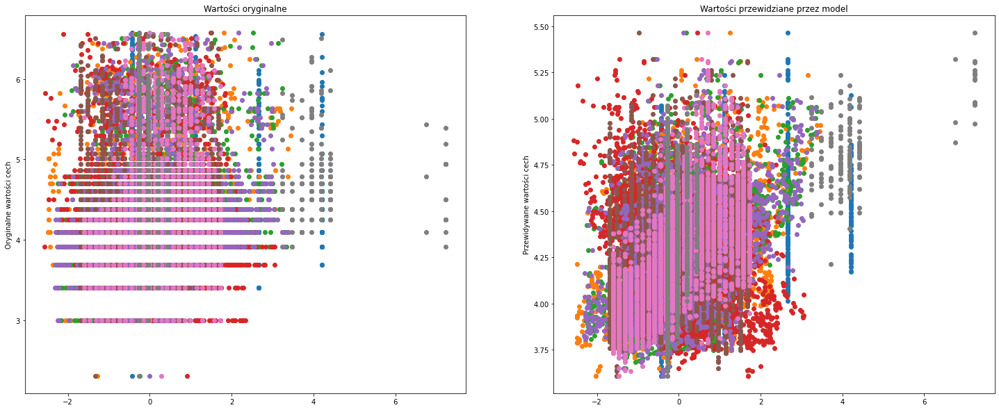

In [46]:
predicted = ridge.predict(X_test_scaled[selected_features])
plt.figure(figsize=(25,10))
plt.subplot(1,2,1)
for i in selected_features:
    plt.scatter(X_test_scaled[i], y_test)
    plt.ylabel("Oryginalne wartości cech")
    plt.title("Wartości oryginalne")

plt.subplot(1,2,2)
for i in selected_features:
    plt.scatter(X_test_scaled[i], predicted)
    plt.ylabel("Przewidywane wartości cech")
    plt.title("Wartości przewidziane przez model")
    
plt.show()

In [47]:
print(f"Procentowy błąd uczący względem wartości średniej: {round((err1/y_test.mean())*100, 3)} %")
print(f"Procentowy błąd testowy względem wartości średniej: {round((err2/y_test.mean())*100, 3)} %")

Procentowy błąd uczący względem wartości średniej: 7.401 %
Procentowy błąd testowy względem wartości średniej: 7.184 %


> Wykorzystując pełen potencjał modelów regresji które dopasowaliśmy do problemu, możemy być zadowoleni z rezultatu.
Widzimy że postępując zgodnie z metodyką nauczoną na kursie otrzymujemy model z błędem około 7%.
Osiągnięcie tego wyniku wymagało starannej analizy zagadnienia i danych.